In [33]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sys
import os
import glob
import sdeint
sys.path.append(os.path.abspath(".."))
# from utils.sample_visualisation import plot_1D_samples
# from utils.input_preparation import sample_matrix_to_det_NN_input
# from models.deterministic.dense_models import get_naive_dense_model

In [34]:
list(glob.glob("./data/*.xlsx"))

['./data\\20160427_mean_d2eGFP.xlsx',
 './data\\20160427_mean_eGFP.xlsx',
 './data\\20160513_mean_d2eGFP.xlsx',
 './data\\20160513_mean_eGFP.xlsx',
 './data\\20160603_mean_d2eGFP.xlsx',
 './data\\20160603_mean_eGFP.xlsx']

In [35]:
dfs = [pd.read_excel(dfile, header=None) for dfile in glob.glob("./data/*.xlsx") if "d2e" not in dfile]

In [36]:
dfs = [df.loc[dfs[0].index, :] for df in dfs]

In [37]:
timepoints = dfs[0][0]

In [38]:
assert all([all(dfs[i][0] == np.asarray(timepoints)) for i in range(len(dfs))])

In [39]:
dfs = [df.drop([0], axis=1).transpose() for df in dfs]

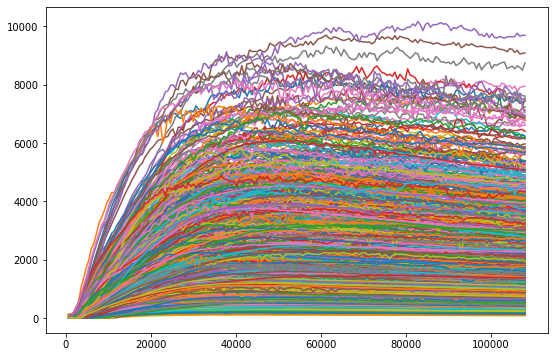

In [40]:
def plot_df(df):
    fig, ax = plt.subplots(figsize = (9, 6))
    for i in range(df.shape[0]):
        ax.plot(timepoints, df.iloc[i, :])
        
plot_df(dfs[0])

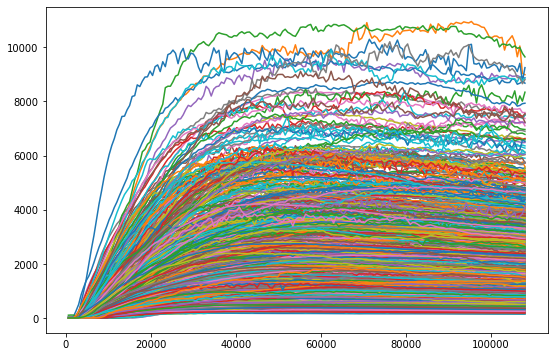

In [41]:
plot_df(dfs[1])

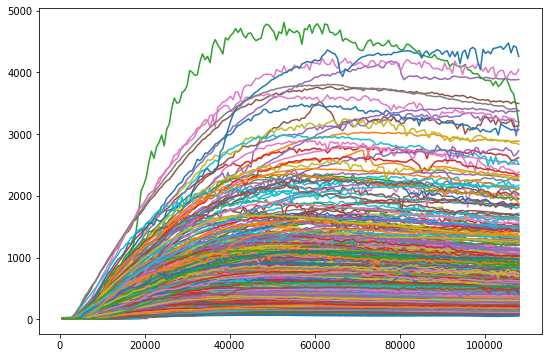

In [42]:
plot_df(dfs[2])

In [43]:
joint_df = pd.concat(dfs[:2], axis=0)

In [44]:
joint_df

,0,1,2,3,4,5,6,7,8,9,...,170,171,172,173,174,175,176,177,178,179
1,7.280,7.054,6.384,6.313,6.758,12.555,39.405,94.545,132.434,173.888,...,1436.743,1381.299,1405.442,1401.411,1368.500,1383.019,1371.097,1393.368,1401.305,1345.116
2,6.827,6.524,6.413,6.343,6.304,11.782,22.004,59.234,80.012,91.698,...,1008.384,1002.915,1006.588,1003.732,1004.834,1010.187,1009.647,1009.720,1008.281,1010.136
3,7.483,7.061,7.251,18.834,38.408,61.551,85.127,105.017,126.594,142.746,...,660.423,659.045,660.095,655.345,654.369,655.732,652.625,651.590,648.158,649.609
4,7.183,6.835,12.145,29.068,48.454,69.341,82.286,103.236,129.131,166.875,...,3489.180,3502.809,3510.418,3496.301,3457.430,3489.003,3386.485,3496.693,3473.076,3468.060
5,7.475,6.940,6.381,6.372,6.251,8.254,8.505,12.877,26.925,48.471,...,3172.817,3161.825,3158.800,3158.241,3145.449,3139.835,3139.723,3133.148,3128.167,3119.921
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
959,7.152,7.155,6.870,6.782,6.819,47.950,88.205,147.418,199.308,266.291,...,2903.650,2899.084,2888.005,2871.751,2872.038,2876.615,2869.332,2865.960,2859.178,2839.058
960,7.531,6.760,6.442,6.573,6.696,9.490,14.718,44.747,63.270,84.957,...,781.762,777.969,771.769,778.669,784.267,788.613,784.334,784.508,783.690,782.550
961,6.844,6.663,6.511,6.474,26.049,127.126,198.516,262.450,340.105,402.237,...,2348.259,2335.252,2333.091,2331.436,2330.394,2318.831,2313.032,2308.900,2303.922,2300.034
962,6.682,6.497,6.526,6.241,6.125,8.378,8.813,8.155,8.274,9.027,...,1569.054,1552.832,1552.445,1549.298,1544.175,1535.035,1534.650,1529.722,1512.173,1512.664


In [45]:
samples = np.log(joint_df.values)
t_hrs = timepoints / 3600

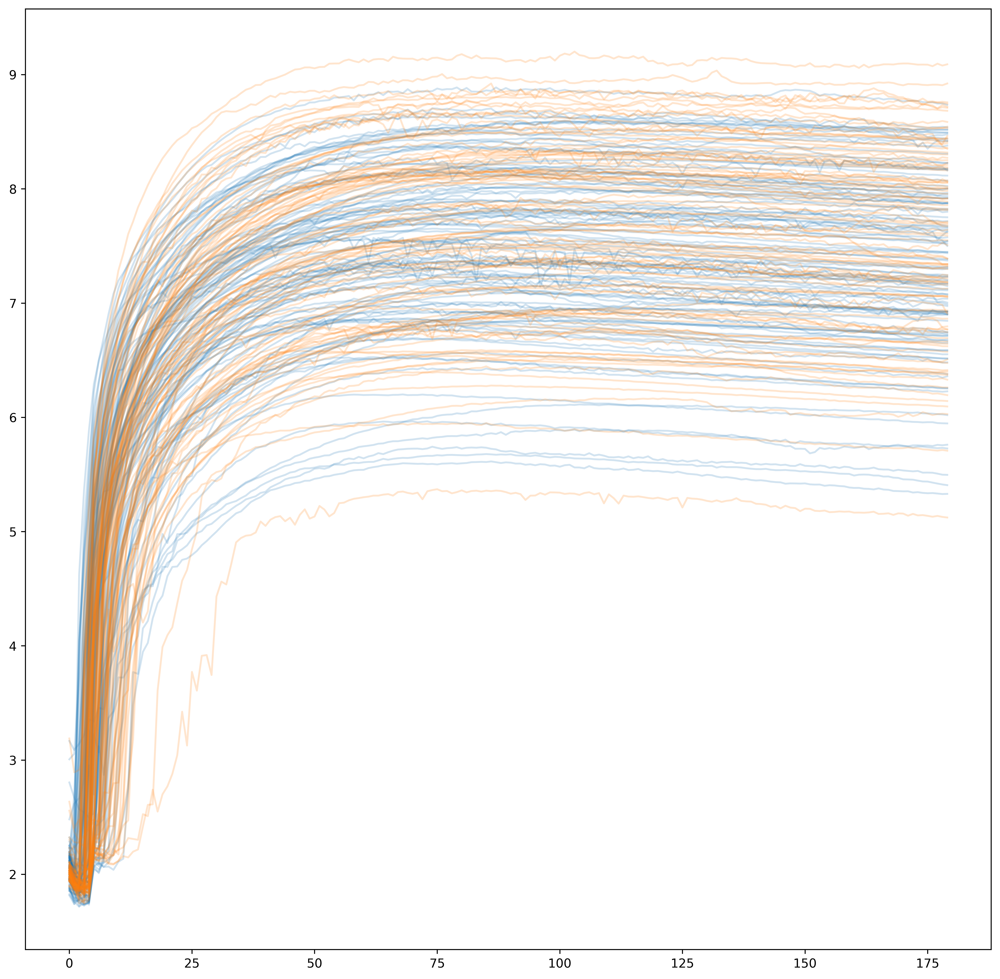

In [46]:
fig, ax = plt.subplots(figsize=(14, 14), dpi=600)

for l, df in enumerate(dfs[:2]):
    for k, row in df.iterrows():
        if k % 10 == 0:
            plt.plot(np.log(list(row)), c=plt.rcParams['axes.prop_cycle'].by_key()['color'][l], alpha=0.2)

In [47]:
from sklearn.model_selection import train_test_split
train_samples, test_samples = train_test_split(samples, shuffle=True, random_state=42, train_size=0.8)

In [48]:
np.save("gfp_train_samples.npy", train_samples)
np.save("gfp_test_samples.npy", test_samples)

In [49]:
train_bms = np.zeros(train_samples.shape)
for i in range(len(train_bms)):
    train_bms[i, :] = sdeint.itoint(f=lambda x, t: 0, G=lambda x, t: 1, tspan=np.asarray(t_hrs).flatten(), y0=0).flatten()

In [ ]:
test_bms = np.zeros(test_samples.shape)
for i in range(len(test_bms)):
    test_bms[i, :] = sdeint.itoint(f=lambda x, t: 0, G=lambda x, t: 1, tspan=np.asarray(t_hrs).flatten(), y0=0).flatten()

In [ ]:
np.save("gfp_train_bms.npy", train_bms)
np.save("gfp_test_bms.npy", test_bms)

In [ ]:
np.save("gfp_tspan.npy", np.asarray(t_hrs))